## Biblioteki:

In [2]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import torch
import torch.nn as nn
from pathlib import Path
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, models
import torch.optim as optim

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Disabling PyTorch because PyTorch >= 2.4 is required but found 2.2.2
PyTorch was not found. Models won't be available and only tokenizers, configuration and file/data utilities can be used.


## Pobranie danych:

In [3]:
train_path = 'dataset/images/train'
val_path = 'dataset/images/validation'

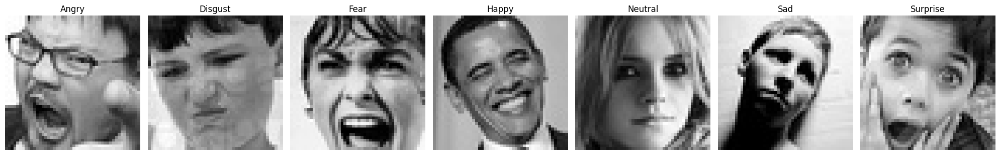

In [4]:
plt.figure(figsize=(20, 5))

plt.subplot(1, 7, 1)
img = mpimg.imread(train_path + '/angry/10420.jpg')
plt.imshow(img, cmap='gray')
plt.title('Angry')
plt.axis('off')

plt.subplot(1, 7, 2)
img = mpimg.imread(train_path + '/disgust/10018.jpg')
plt.imshow(img, cmap='gray')
plt.title('Disgust')
plt.axis('off')

plt.subplot(1, 7, 3)
img = mpimg.imread(train_path + '/fear/10201.jpg')
plt.imshow(img, cmap='gray')
plt.title('Fear')
plt.axis('off')

plt.subplot(1, 7, 4)
img = mpimg.imread(train_path + '/happy/10000.jpg')
plt.imshow(img, cmap='gray')
plt.title('Happy')
plt.axis('off')

plt.subplot(1, 7, 5)
img = mpimg.imread(train_path + '/neutral/11246.jpg')
plt.imshow(img, cmap='gray')
plt.title('Neutral')
plt.axis('off')

plt.subplot(1, 7, 6)
img = mpimg.imread(train_path + '/sad/16250.jpg')
plt.imshow(img, cmap='gray')
plt.title('Sad')
plt.axis('off')

plt.subplot(1, 7, 7)
img = mpimg.imread(train_path + '/surprise/10261.jpg')
plt.imshow(img, cmap='gray')
plt.title('Surprise')
plt.axis('off')

plt.tight_layout()
plt.show()

## Przygotowanie danych:

In [5]:
train_transforms = transforms.Compose([
    transforms.Resize((224, 224)), # rozmiar wymagany do uzywanych cnn 
    transforms.RandomHorizontalFlip(), # czesc z obrazkow odbijamy by utrudnic uczenie
    transforms.RandomRotation(15), # obracanie obrazu
    transforms.Grayscale(num_output_channels=3), # zmienia na czarno-biale 
    transforms.ToTensor(), # z obrazka na tenosr
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]) # normalizacja
])

val_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.Grayscale(num_output_channels=3),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])


train_dataset = datasets.ImageFolder(train_path, transform=train_transforms)
val_dataset = datasets.ImageFolder(val_path, transform=val_transforms)

#len(train_dataset)
#len(val_dataset) 

## Loadery:


In [6]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
batch_size = 32

train_loader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True, # przed kazda epoka tasuje
    num_workers=0,
    pin_memory=torch.cuda.is_available(),
)
val_loader = DataLoader(
    val_dataset,
    batch_size=batch_size,
    shuffle=False,
    num_workers=0,
    pin_memory=torch.cuda.is_available(),
)

## Odwrócenie normalizacji

In [7]:
MEAN = torch.tensor([0.485, 0.456, 0.406], dtype=torch.float32)
STD = torch.tensor([0.229, 0.224, 0.225], dtype=torch.float32)

def denormalize(images, mean=MEAN, std=STD):
    mean = mean.to(images.device).view(1, -1, 1, 1) # zeby obrazy i tensory byly razem na cpu/gpu, view - dostosowuje ksztalt
    std = std.to(images.device).view(1, -1, 1, 1)
    return images * std + mean

## Wzór FGSM

## x_adv = x + ε · sign(∇ₓ L(θ, x, y))

Do kazdego piksela dodajemy "szum", gdzie:
- ε - to siła ataku (parametr, który dostosowujemy)
- sign(∇ₓ L(θ, x, y)):
    * Funkcja L(θ, x, y) to funkcja straty, która mówi o ile model się mylił przy klasyfikacji obrazu x. Im większe L, tym większy błąd modelu.
    * Parametr θ to wagi modelu wzięte z treningu (tu są stałe)
    * x - obraz wejściowy
    * y - etykieta


## FGSM

In [8]:
def fgsm(image, epsilon, data_grad, mean=MEAN, std=STD):
    sign_data_grad = data_grad.sign() # bierzemy znak
    per = epsilon * sign_data_grad # sila ataku * w ktora strone
    per_image = image + per # zmodyfikowany obraz
    #dbamy zeby piksele nie wyszly poza wartosci [0,1]
    l=((0.0 - mean)/std).to(image.device).view(1, -1, 1, 1)
    u=((1.0 - mean)/std).to(image.device).view(1, -1, 1, 1)
    per_image = torch.max(torch.min(per_image, u), l) # przycinamy wartosci
    return per_image.detach(), per.detach() # zostawiamy same tensory bez pamieci obliczen 

## Testy:

In [9]:
def test(model, device, test_loader, epsilon):
    model.eval()
    cross = nn.CrossEntropyLoss()
    correct = 0
    total = 0
    collected = []

    for data, target in test_loader:
        data = data.to(device) #gpu/cpu - przyspieszenoe jesli sie da
        target = target.to(device)
        data.requires_grad = True

        output = model(data) # sprawdzamy faktyczne przewidywanie
        init_pred = output.argmax(dim=1)

        loss = cross(output, target) # GRADIENT
        model.zero_grad(set_to_none=True) 
        loss.backward() 

        adv_data, noise = fgsm(data, epsilon, data.grad.detach()) # atak fgsm
        final_pred = model(adv_data).argmax(dim=1)

        correct = correct + (final_pred == target).sum().item() 
        total = total + target.size(0)
        
        for i in range(data.size(0)):
            collected.append({
                'label':int(target[i].item()),
                'init_pred':int(init_pred[i].item()),
                'final_pred':int(final_pred[i].item()),
                'original':data[i].detach().cpu(),
                'noise':noise[i].detach().cpu(),
                'adversarial':adv_data[i].detach().cpu(),
                })

    return (correct/total, collected)

## Wizualizacja

In [10]:
def tensor_to_image(tensor): 
    if tensor.dim() == 3:
        tensor = tensor.unsqueeze(0) # dodajemy wymiar batchu
    img = denormalize(tensor).squeeze(0).permute(1, 2, 0).numpy() # odwraca normalizacje, zamienia kolejnosc kanalow dla numpy
    return np.clip(img, 0.0, 1.0) #przycina wartosci

def noise_to_image(noise_tensor):
    noise = noise_tensor.permute(1, 2, 0).numpy() # zmieniamy wymiary, zeby sie zgadzaly
    max_abs = np.max(np.abs(noise)) # najwiekszy blad bezwzgedny 
    if max_abs == 0:
        return np.zeros_like(noise)
    return (noise / (2 * max_abs)) + 0.5

# ResNet18

In [10]:
model = models.resnet18(weights='IMAGENET1K_V1')
num_ftrs = model.fc.in_features
model.fc = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(num_ftrs, len(val_dataset.classes))
)

checkpoint_path = Path('resnet18_improved.pth')
state_dict = torch.load(checkpoint_path, map_location=device)
model.load_state_dict(state_dict)
model = model.to(device)
class_names = val_dataset.classes

epsilons = [0, 0.05,0.1,0.3]
accuracies = []
collected_by_epsilon = {}

## Dokładność w zależności od epsilona:


In [11]:
for eps in epsilons:
    acc, ex = test(model, device, val_loader, eps)
    accuracies.append(acc)
    collected_by_epsilon[eps] = ex
    print(f'Epsilon:{eps}\tAccuracy:{acc:.4f}')

Epsilon:0	Accuracy:0.6830
Epsilon:0.05	Accuracy:0.0042
Epsilon:0.1	Accuracy:0.0228
Epsilon:0.3	Accuracy:0.1606


[0, 0.05, 0.1, 0.3] [0.6829889612227569, 0.0042456835550523635, 0.02278516841211435, 0.16062836116614776]


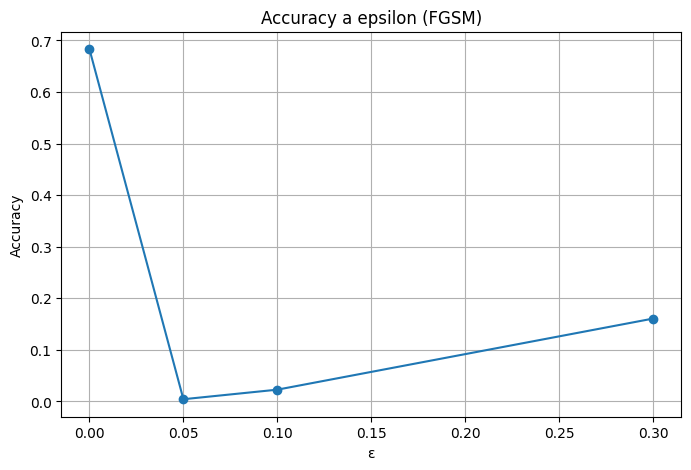

In [12]:
plt.figure(figsize=(8, 5))
print(epsilons,accuracies)
plt.plot(epsilons, accuracies, marker='o')
plt.title('Accuracy a epsilon (FGSM)')
plt.xlabel('ε')
plt.ylabel('Accuracy')
plt.grid(True)
plt.show()

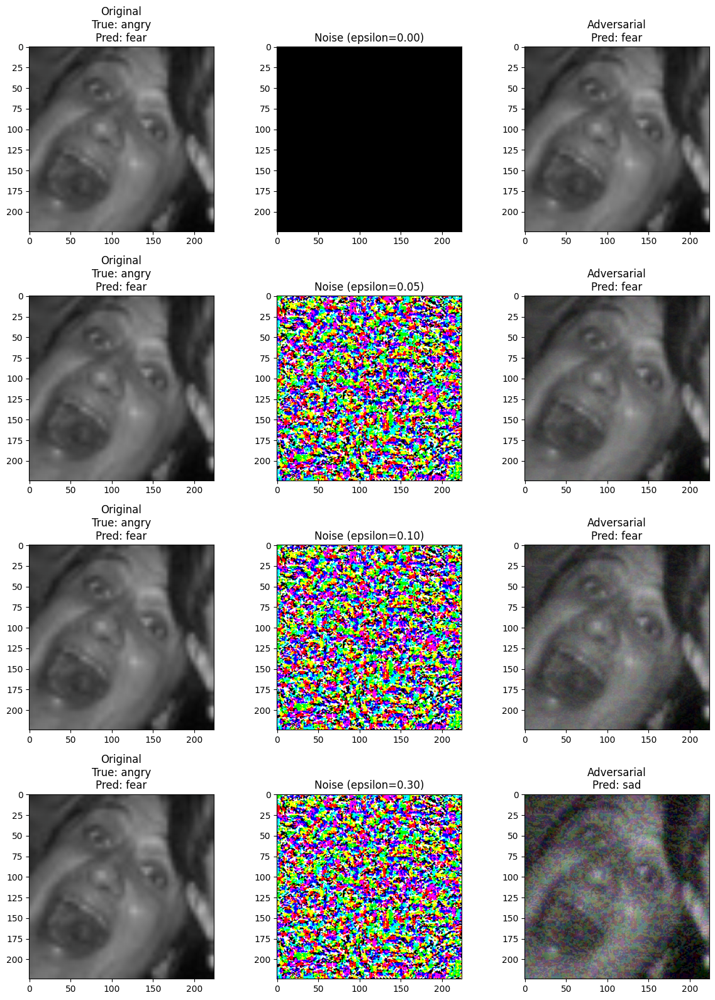

In [13]:
rows = len(epsilons)
fig = plt.figure(figsize=(12, 4 * rows))
axes = fig.subplots(rows, 3)

for r, eps in enumerate(epsilons):
    ex_list = collected_by_epsilon.get(eps, []) # pobeoramy liste przykladow

    sample = ex_list[15] #jeden z wybranych przykladow
    
    label_name = class_names[sample['label']] # prawdziwe
    init_name = class_names[sample['init_pred']] #przed
    final_name = class_names[sample['final_pred']] #po 

    axes[r, 0].imshow(tensor_to_image(sample['original']))
    axes[r, 0].set_title(f'Original\nTrue: {label_name}\nPred: {init_name}')

    axes[r, 1].imshow(noise_to_image(sample['noise']))
    axes[r, 1].set_title(f'Noise (epsilon={eps:.2f})')

    axes[r, 2].imshow(tensor_to_image(sample['adversarial']))
    axes[r, 2].set_title(f'Adversarial\nPred: {final_name}')

plt.tight_layout()
plt.show()


# VGG16

In [16]:
model_vgg = models.vgg16(weights='VGG16_Weights.IMAGENET1K_V1')

model_vgg.classifier[6] = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(4096, 7)
)

checkpoint_path = Path('vgg16_emotion_improved.pth')

state_dict = torch.load(checkpoint_path, map_location=device)
model_vgg.load_state_dict(state_dict)
model_vgg = model_vgg.to(device)
class_names = val_dataset.classes

epsilons = [0, 0.05,0.1,0.3]
accuracies_vgg= []
collected_by_epsilon_vgg = {}

## Dokładność w zależności od epsilona:

In [17]:
for eps in epsilons:
    acc, ex = test(model_vgg, device, val_loader, eps)
    accuracies_vgg.append(acc)
    collected_by_epsilon_vgg[eps] = ex
    print(f'Epsilon:{eps}\tAccuracy:{acc:.4f}')

Epsilon:0	Accuracy:0.5851
Epsilon:0.05	Accuracy:0.0146
Epsilon:0.1	Accuracy:0.0685
Epsilon:0.3	Accuracy:0.1701


[0, 0.05, 0.1, 0.3] [0.5850551938862156, 0.014576846872346448, 0.06849702802151146, 0.17011038777243137]


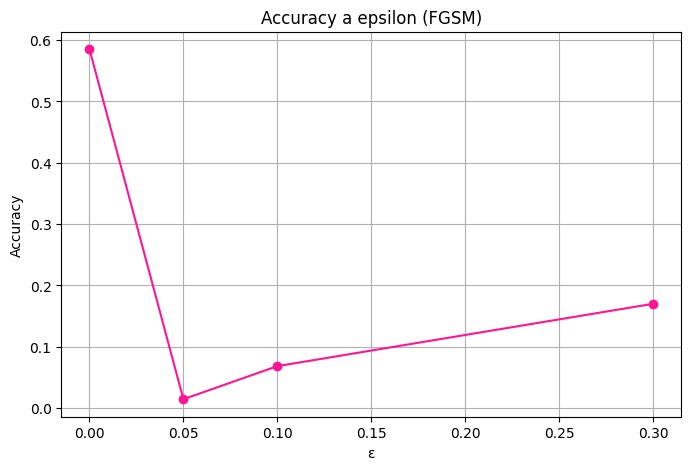

In [30]:
plt.figure(figsize=(8, 5))
print(epsilons,accuracies_vgg)
plt.plot(epsilons, accuracies_vgg, marker='o', color='deeppink')
plt.title('Accuracy a epsilon (FGSM)')
plt.xlabel('ε')
plt.ylabel('Accuracy')
plt.grid(True)
plt.show()

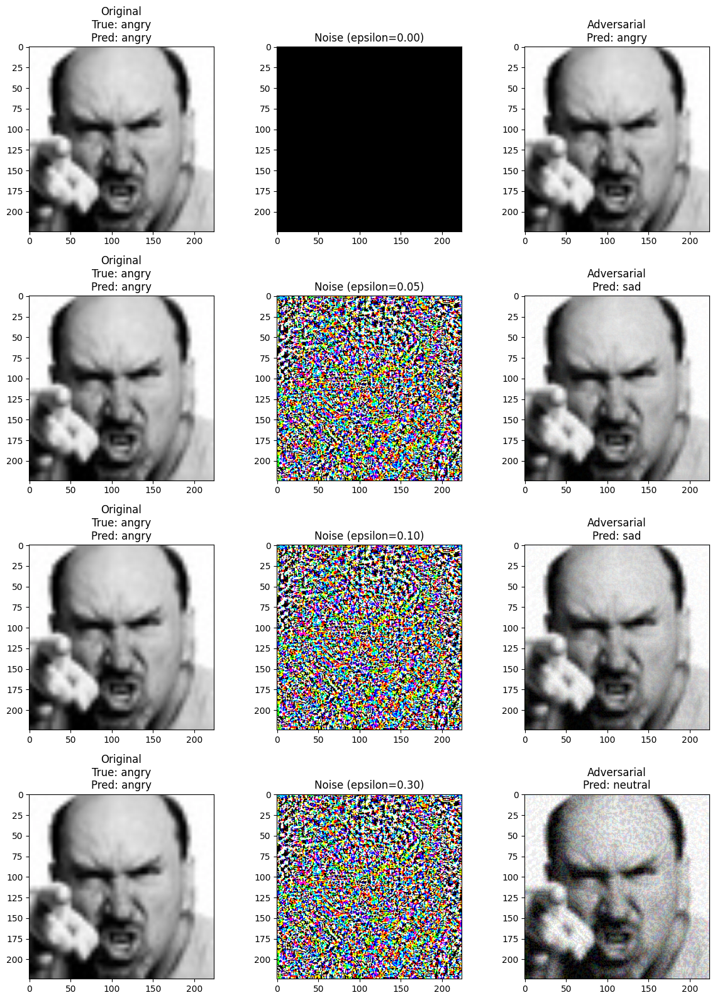

In [25]:
rows = len(epsilons)
fig = plt.figure(figsize=(12, 4 * rows))
axes = fig.subplots(rows, 3)

for r, eps in enumerate(epsilons):
    ex_list = collected_by_epsilon_vgg.get(eps, []) # pobeoramy liste przykladow

    sample = ex_list[103] #jeden z wybranych przykladow, do pokazania: 103 - 3 rozne. 100 - wraca do dobrego
    
    label_name = class_names[sample['label']] # prawdziwe
    init_name = class_names[sample['init_pred']] #przed
    final_name = class_names[sample['final_pred']] #po 

    axes[r, 0].imshow(tensor_to_image(sample['original']))
    axes[r, 0].set_title(f'Original\nTrue: {label_name}\nPred: {init_name}')

    axes[r, 1].imshow(noise_to_image(sample['noise']))
    axes[r, 1].set_title(f'Noise (epsilon={eps:.2f})')

    axes[r, 2].imshow(tensor_to_image(sample['adversarial']))
    axes[r, 2].set_title(f'Adversarial\nPred: {final_name}')

plt.tight_layout()
plt.show()

# Mobilenet v2

In [12]:

model_mo = models.mobilenet_v2(weights='IMAGENET1K_V1')

num_ftrs = model_mo.classifier[1].in_features

model_mo.classifier[1] = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(num_ftrs, 7)
)

model_mo = model_mo.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model_mo.parameters(), lr=0.0001, weight_decay=1e-4)
class_names = val_dataset.classes
checkpoint_path = Path('mobilenet_v2_improved.pth')
state_dict = torch.load(checkpoint_path, map_location=device)
model_mo.load_state_dict(state_dict)

epsilons = [0, 0.05,0.1,0.3]
accuracies_mo= []
collected_by_epsilon_mo= {}


## Dokładność w zaleności od epsilona

In [13]:
for eps in epsilons:
    acc, ex = test(model_mo, device, val_loader, eps)
    accuracies_mo.append(acc)
    collected_by_epsilon_mo[eps] = ex
    print(f'Epsilon:{eps}\tAccuracy:{acc:.4f}')

Epsilon:0	Accuracy:0.6772
Epsilon:0.05	Accuracy:0.2676
Epsilon:0.1	Accuracy:0.2703
Epsilon:0.3	Accuracy:0.2622


[0, 0.05, 0.1, 0.3] [0.6771865270308519, 0.2676195867534673, 0.27030851967166714, 0.26224172091706766]


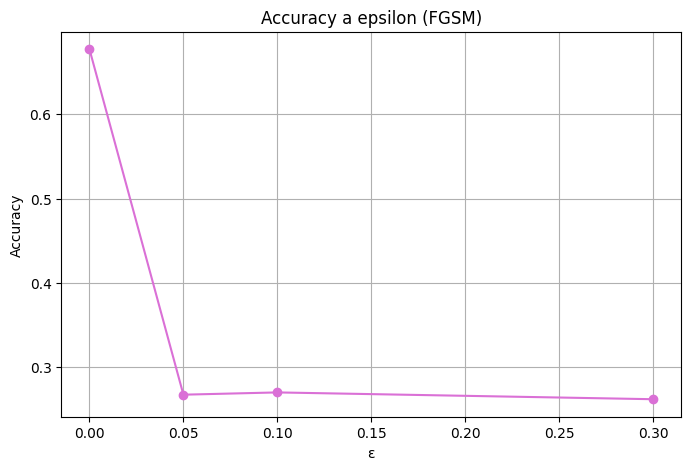

In [19]:
plt.figure(figsize=(8, 5))
print(epsilons,accuracies_mo)
plt.plot(epsilons, accuracies_mo, marker='o', color='orchid')
plt.title('Accuracy a epsilon (FGSM)')
plt.xlabel('ε')
plt.ylabel('Accuracy')
plt.grid(True)
plt.show()

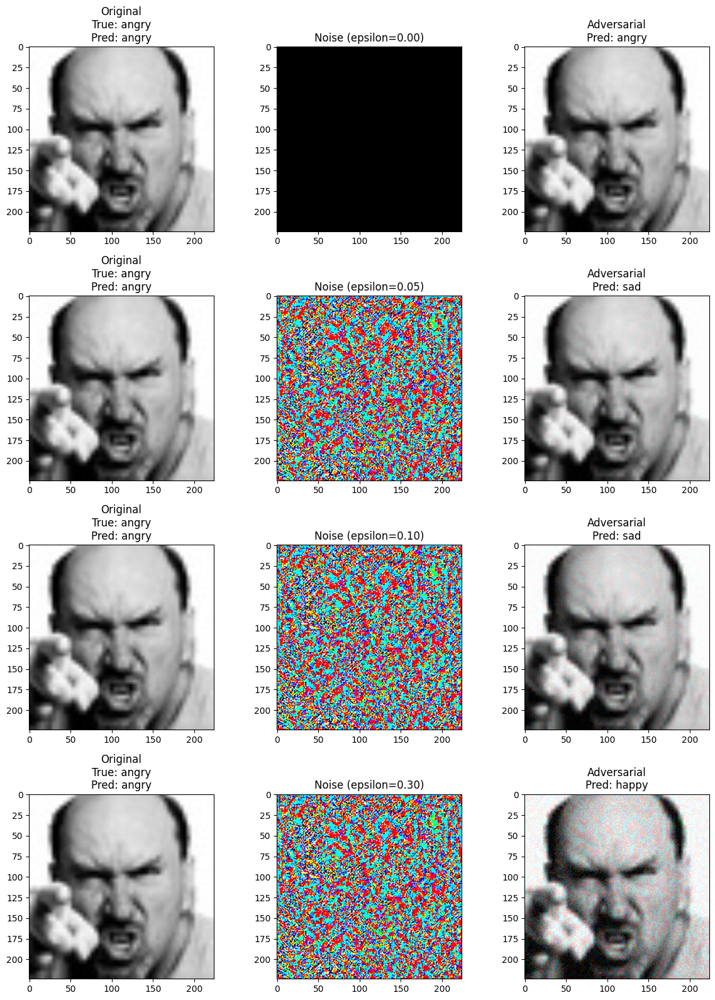

In [20]:
rows = len(epsilons)
fig = plt.figure(figsize=(12, 4 * rows))
axes = fig.subplots(rows, 3)

for r, eps in enumerate(epsilons):
    ex_list = collected_by_epsilon_mo.get(eps, []) # pobeoramy liste przykladow

    sample = ex_list[103] #jeden z wybranych przykladow, do pokazania: 103 - 3 rozne. 100 - wraca do dobrego
    
    label_name = class_names[sample['label']] # prawdziwe
    init_name = class_names[sample['init_pred']] #przed
    final_name = class_names[sample['final_pred']] #po 

    axes[r, 0].imshow(tensor_to_image(sample['original']))
    axes[r, 0].set_title(f'Original\nTrue: {label_name}\nPred: {init_name}')

    axes[r, 1].imshow(noise_to_image(sample['noise']))
    axes[r, 1].set_title(f'Noise (epsilon={eps:.2f})')

    axes[r, 2].imshow(tensor_to_image(sample['adversarial']))
    axes[r, 2].set_title(f'Adversarial\nPred: {final_name}')

plt.tight_layout()
plt.show()

# **PO TRENINGU ADWERSARIALNYM:**

# ResNet18

In [12]:
model_trades = models.resnet18(weights='IMAGENET1K_V1')
num_ftrs = model_trades.fc.in_features
model_trades.fc = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(num_ftrs, len(val_dataset.classes))
)

checkpoint_path = Path('resnet18_trades.pth')
state_dict = torch.load(checkpoint_path, map_location=device)
model_trades.load_state_dict(state_dict)
model_trades = model_trades.to(device)
class_names = val_dataset.classes

epsilons = [0, 0.05,0.1,0.3]
accuracies_trades = []
collected_by_epsilon_trades = {}

In [13]:
for eps in epsilons:
    acc, ex = test(model_trades, device, val_loader, eps)
    accuracies_trades.append(acc)
    collected_by_epsilon_trades[eps] = ex
    print(f'Epsilon:{eps}\tAccuracy:{acc:.4f}')

Epsilon:0	Accuracy:0.5004
Epsilon:0.05	Accuracy:0.1203
Epsilon:0.1	Accuracy:0.0995
Epsilon:0.3	Accuracy:0.1187


[0, 0.05, 0.1, 0.3] [0.5004245683555052, 0.1202943673931503, 0.09949051797339371, 0.11873761675629776]


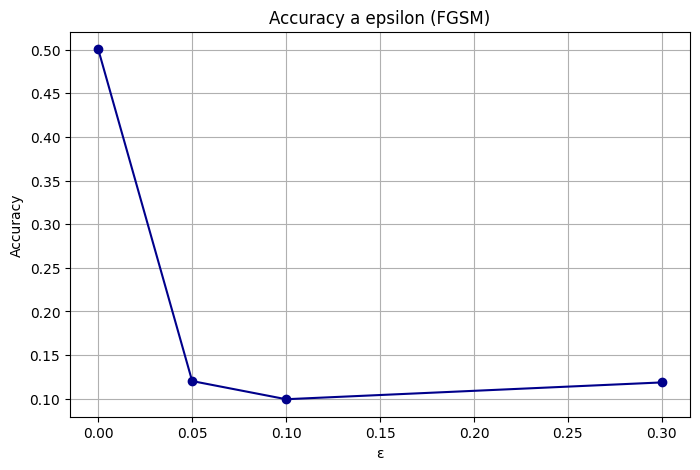

In [22]:
plt.figure(figsize=(8, 5))
print(epsilons,accuracies_trades)
plt.plot(epsilons, accuracies_trades, marker='o', color="darkblue")
plt.title('Accuracy a epsilon (FGSM)')
plt.xlabel('ε')
plt.ylabel('Accuracy')
plt.grid(True)
plt.show()

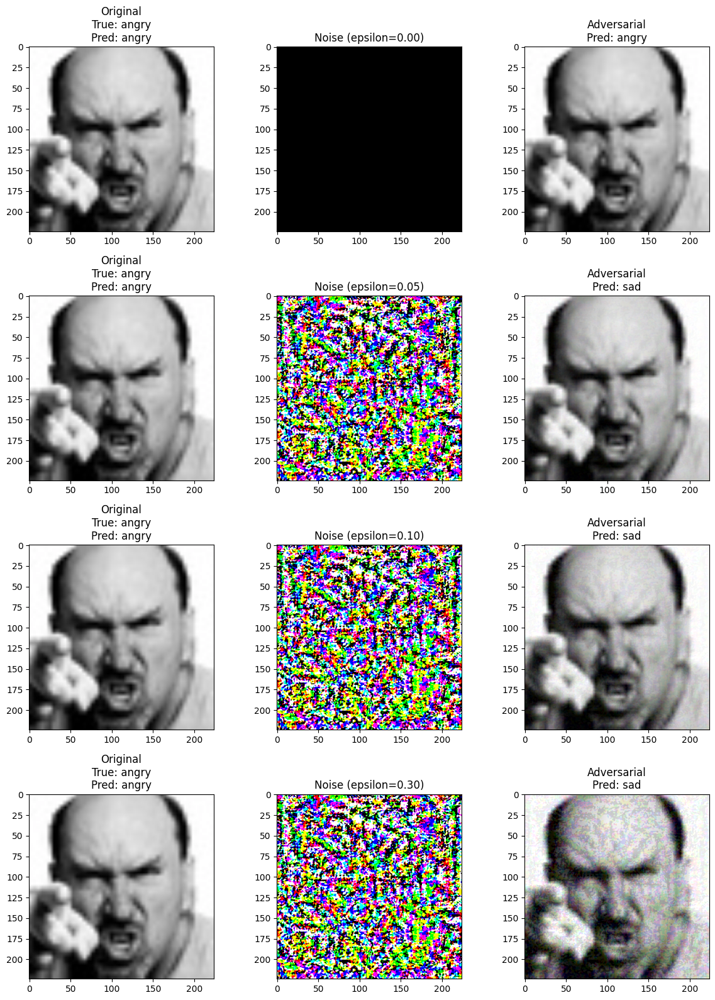

In [ ]:
rows = len(epsilons)
fig = plt.figure(figsize=(12, 4 * rows))
axes = fig.subplots(rows, 3)

for r, eps in enumerate(epsilons):
    ex_list = collected_by_epsilon_trades.get(eps, []) # pobeoramy liste przykladow

    sample = ex_list[103] #jeden z wybranych przykladow
    
    label_name = class_names[sample['label']] # prawdziwe
    init_name = class_names[sample['init_pred']] #przed
    final_name = class_names[sample['final_pred']] #po 

    axes[r, 0].imshow(tensor_to_image(sample['original']))
    axes[r, 0].set_title(f'Original\nTrue: {label_name}\nPred: {init_name}')

    axes[r, 1].imshow(noise_to_image(sample['noise']))
    axes[r, 1].set_title(f'Noise (epsilon={eps:.2f})')

    axes[r, 2].imshow(tensor_to_image(sample['adversarial']))
    axes[r, 2].set_title(f'Adversarial\nPred: {final_name}')

plt.tight_layout()
plt.show()

## VGG16

In [19]:
model_trades_vgg = models.vgg16(weights='VGG16_Weights.IMAGENET1K_V1')
model_trades_vgg.classifier[6] = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(4096, 7)
)

checkpoint_path = Path('vgg16_trades_linfty.pth')

state_dict = torch.load(checkpoint_path, map_location=device)
model_trades_vgg.load_state_dict(state_dict)
model_trades_vgg = model_trades_vgg.to(device)
class_names = val_dataset.classes

epsilons = [0, 0.05,0.1,0.3]
accuracies_trades_vgg= []
collected_by_epsilon_trades_vgg = {}

In [20]:
for eps in epsilons:
    acc, ex = test(model_trades_vgg, device, val_loader, eps)
    accuracies_trades_vgg.append(acc)
    collected_by_epsilon_trades_vgg[eps] = ex
    print(f'Epsilon:{eps}\tAccuracy:{acc:.4f}')

Epsilon:0	Accuracy:0.3159
Epsilon:0.05	Accuracy:0.1954
Epsilon:0.1	Accuracy:0.2117
Epsilon:0.3	Accuracy:0.2430


[0, 0.05, 0.1, 0.3] [0.31587885649589587, 0.19544296631757713, 0.21171808661194452, 0.2429946221341636]


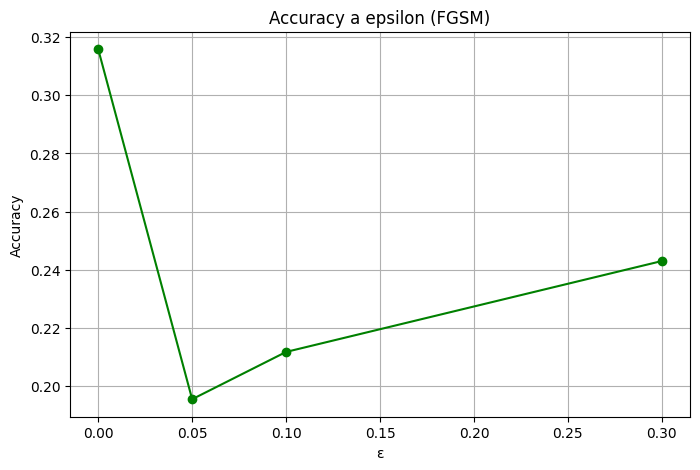

In [22]:
plt.figure(figsize=(8, 5))
print(epsilons,accuracies_trades_vgg)
plt.plot(epsilons, accuracies_trades_vgg, marker='o', color='green')
plt.title('Accuracy a epsilon (FGSM)')
plt.xlabel('ε')
plt.ylabel('Accuracy')
plt.grid(True)
plt.show()

## MobileNet

In [ ]:
model_mo_trades = models.mobilenet_v2(weights='IMAGENET1K_V1')

num_ftrs = model_mo_trades.classifier[1].in_features

model_mo_trades.classifier[1] = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(num_ftrs, 7)
)

model_mo_trades = model_mo_trades.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model_mo_trades.parameters(), lr=0.0001, weight_decay=1e-4)
class_names = val_dataset.classes
checkpoint_path = Path('mobilenet_v2_trades_linfty.pth')
state_dict = torch.load(checkpoint_path, map_location=device)
model_mo_trades.load_state_dict(state_dict)

epsilons = [0, 0.05,0.1,0.3]
accuracies_mo_trades= []
collected_by_epsilon_mo_trades= {}

In [11]:
for eps in epsilons:
    acc, ex = test(model_mo_trades, device, val_loader, eps)
    accuracies_mo_trades.append(acc)
    collected_by_epsilon_mo_trades[eps] = ex
    print(f'Epsilon:{eps}\tAccuracy:{acc:.4f}')

Epsilon:0	Accuracy:0.4325
Epsilon:0.05	Accuracy:0.1370
Epsilon:0.1	Accuracy:0.1935
Epsilon:0.3	Accuracy:0.1647


[0, 0.05, 0.1, 0.3] [0.4324936314746674, 0.13699405604302292, 0.19346164732521937, 0.1647325219360317]


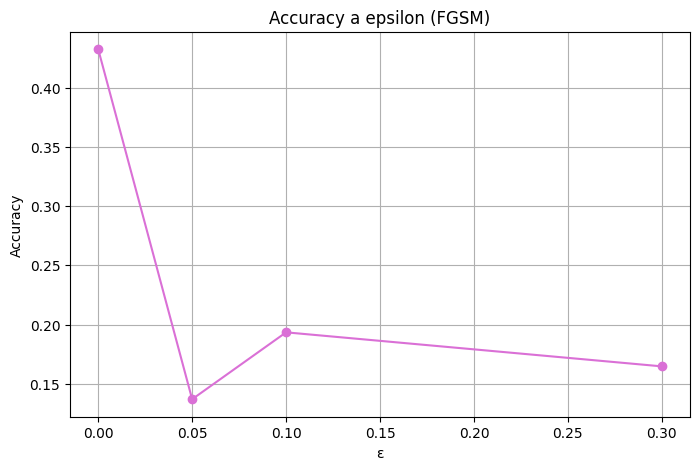

In [12]:
plt.figure(figsize=(8, 5))
print(epsilons,accuracies_mo_trades)
plt.plot(epsilons, accuracies_mo_trades, marker='o', color='orchid')
plt.title('Accuracy a epsilon (FGSM)')
plt.xlabel('ε')
plt.ylabel('Accuracy')
plt.grid(True)
plt.show()

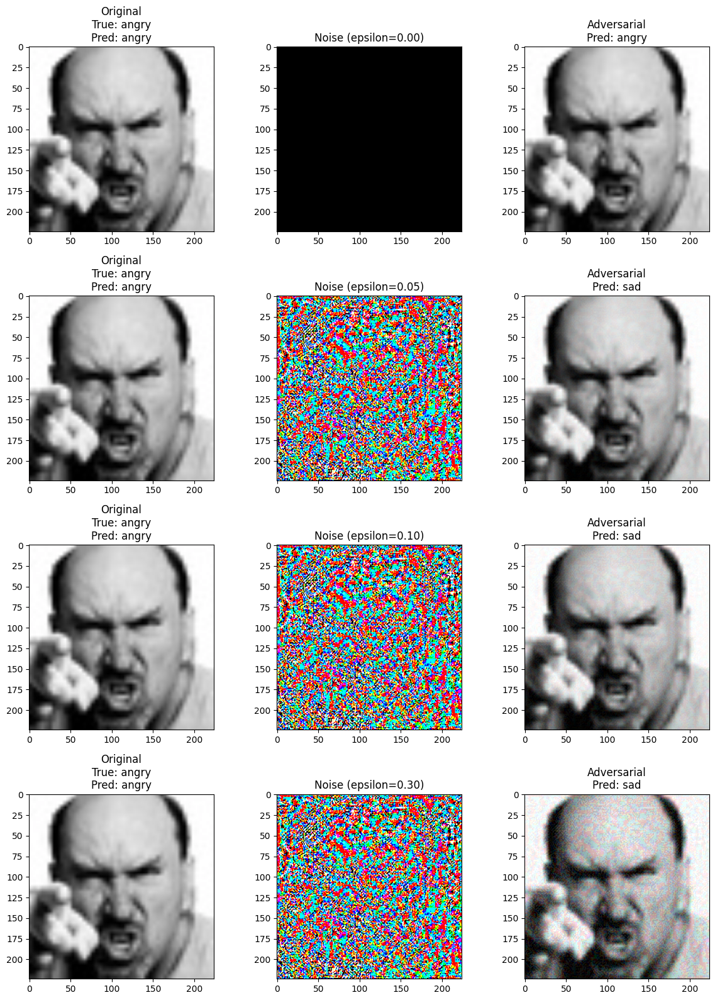

In [13]:
rows = len(epsilons)
fig = plt.figure(figsize=(12, 4 * rows))
axes = fig.subplots(rows, 3)

for r, eps in enumerate(epsilons):
    ex_list = collected_by_epsilon_mo_trades.get(eps, []) # pobeoramy liste przykladow

    sample = ex_list[103] #jeden z wybranych przykladow, do pokazania: 103 - 3 rozne. 100 - wraca do dobrego
    
    label_name = class_names[sample['label']] # prawdziwe
    init_name = class_names[sample['init_pred']] #przed
    final_name = class_names[sample['final_pred']] #po 

    axes[r, 0].imshow(tensor_to_image(sample['original']))
    axes[r, 0].set_title(f'Original\nTrue: {label_name}\nPred: {init_name}')

    axes[r, 1].imshow(noise_to_image(sample['noise']))
    axes[r, 1].set_title(f'Noise (epsilon={eps:.2f})')

    axes[r, 2].imshow(tensor_to_image(sample['adversarial']))
    axes[r, 2].set_title(f'Adversarial\nPred: {final_name}')

plt.tight_layout()
plt.show()

# Mobilenet z modyfikacją 1

In [11]:
model_mo_tradesl1 = models.mobilenet_v2(weights='IMAGENET1K_V1')

num_ftrs = model_mo_tradesl1.classifier[1].in_features

model_mo_tradesl1.classifier[1] = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(num_ftrs, 7)
)

model_mo_tradesl1 = model_mo_tradesl1.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model_mo_tradesl1.parameters(), lr=0.0001, weight_decay=1e-4)
class_names = val_dataset.classes
checkpoint_path = Path('mobilenet_v2_trades_l2-1.pth')
state_dict = torch.load(checkpoint_path, map_location=device)
model_mo_tradesl1.load_state_dict(state_dict)

epsilons = [0, 0.05,0.1,0.3]
accuracies_mo_tradesl1= []
collected_by_epsilon_mo_tradesl1= {}

In [12]:
for eps in epsilons:
    acc, ex = test(model_mo_tradesl1, device, val_loader, eps)
    accuracies_mo_tradesl1.append(acc)
    collected_by_epsilon_mo_tradesl1[eps] = ex
    print(f'Epsilon:{eps}\tAccuracy:{acc:.4f}')

Epsilon:0	Accuracy:0.6686
Epsilon:0.05	Accuracy:0.1160
Epsilon:0.1	Accuracy:0.1643
Epsilon:0.3	Accuracy:0.1657


[0, 0.05, 0.1, 0.3] [0.6685536371355788, 0.11604868383809794, 0.16430795358052647, 0.1657231814322106]


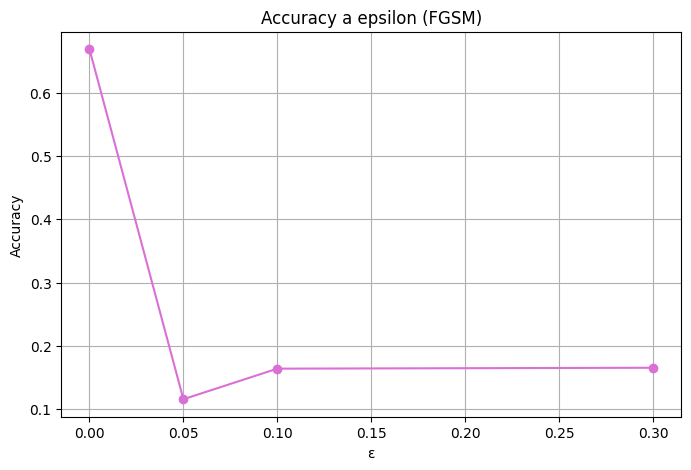

In [13]:
plt.figure(figsize=(8, 5))
print(epsilons,accuracies_mo_tradesl1)
plt.plot(epsilons, accuracies_mo_tradesl1, marker='o', color='orchid')
plt.title('Accuracy a epsilon (FGSM)')
plt.xlabel('ε')
plt.ylabel('Accuracy')
plt.grid(True)
plt.show()

# Mobilenet z modyfikacją 2

# Zebranie wyników

In [ ]:
# MobileNet 
# przed
# [0.6771865270308519, 0.2676195867534673, 0.27030851967166714, 0.26224172091706766]
# po treningu
# [0.4324936314746674, 0.13699405604302292, 0.19346164732521937, 0.1647325219360317]

# Vgg 
# przed
# [0.5850551938862156, 0.014576846872346448, 0.06849702802151146, 0.17011038777243137]
# po treningu
# [0.31587885649589587, 0.19544296631757713, 0.21171808661194452, 0.2429946221341636]

# Resnet
# przed
# [0.6829889612227569, 0.0042456835550523635, 0.02278516841211435, 0.16062836116614776]
# po treningu
# [0.5004245683555052, 0.1202943673931503, 0.09949051797339371, 0.11873761675629776]

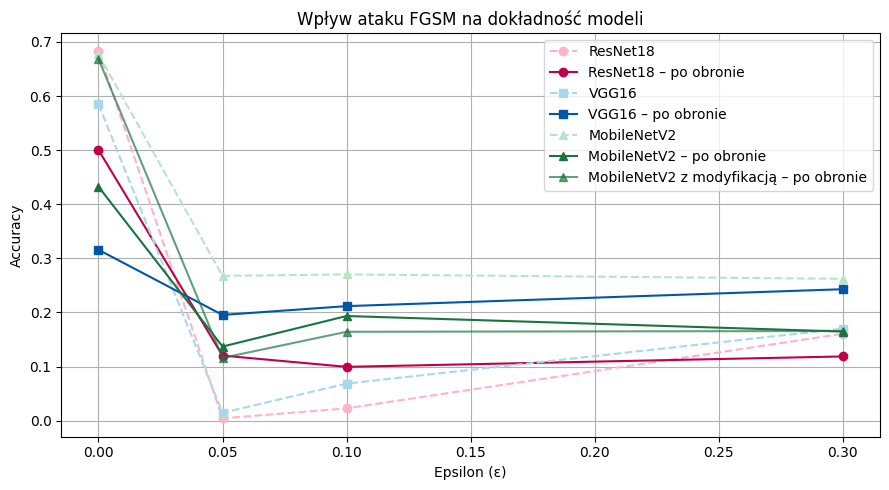

In [2]:
import matplotlib.pyplot as plt

epsilons = [0, 0.05, 0.1, 0.3]

accuracies_resnet_przed = [0.6829889612227569, 0.0042456835550523635, 0.02278516841211435, 0.16062836116614776]
accuracies_resnet_po = [0.5004245683555052, 0.1202943673931503, 0.09949051797339371, 0.11873761675629776]

accuracies_vgg_przed = [0.5850551938862156, 0.014576846872346448, 0.06849702802151146, 0.17011038777243137]
accuracies_vgg_po = [0.31587885649589587, 0.19544296631757713, 0.21171808661194452, 0.2429946221341636]

accuracies_mo_przed = [0.6771865270308519, 0.2676195867534673, 0.27030851967166714, 0.26224172091706766]
accuracies_mo_po = [0.4324936314746674, 0.13699405604302292, 0.19346164732521937, 0.1647325219360317]
accuracies_mo_mod_po = [0.6685536371355788, 0.11604868383809794, 0.16430795358052647, 0.1657231814322106]

plt.figure(figsize=(9, 5))

plt.plot(epsilons, accuracies_resnet_przed,color='#FFB3C6', marker='o', linestyle='--', label='ResNet18')
plt.plot(epsilons, accuracies_resnet_po,color='#C0004A', marker='o', label='ResNet18 – po obronie')

plt.plot(epsilons, accuracies_vgg_przed, color='#A8D8EA', marker='s', linestyle='--', label='VGG16')
plt.plot(epsilons, accuracies_vgg_po, color='#0057A8', marker='s', label='VGG16 – po obronie')

plt.plot(epsilons, accuracies_mo_przed,color='#B7E4C7', marker='^', linestyle='--', label='MobileNetV2')
plt.plot(epsilons, accuracies_mo_po,color='#1B7340', marker='^', label='MobileNetV2 – po obronie')
plt.plot(epsilons, accuracies_mo_mod_po,color="#1B7340AD", marker='^', label='MobileNetV2 z modyfikacją – po obronie')

plt.xlabel('Epsilon (ε)')
plt.ylabel('Accuracy')
plt.title('Wpływ ataku FGSM na dokładność modeli')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig('fgsm_plot.png', dpi=150)